In [2]:
#!/usr/bin/python
%pylab inline

import numpy as np
import pandas as pd
import cv2
import os, sys, glob
import scipy as sp
import sklearn
from sklearn import linear_model
import urllib
import keras
from os.path import join
import dvt
from dvt_workshop import (
    dvt_detectron_config,
    dvt_tidy_instance_data,
    dvt_show_instance_predictions,
    dvt_load_embed_image_model,
    dvt_embed_image
)
import matplotlib.pyplot as plt
import matplotlib.patches as patches


plt.rcParams["figure.figsize"] = (12,12)
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

Populating the interactive namespace from numpy and matplotlib


In [3]:
#import metadata
meta = pd.read_csv("./JPGs/Spelman.csv")

In [4]:
#initialize
dvt_image_segment, md = dvt_detectron_config()

RuntimeError: CUDA error: out of memory

In [11]:
#locate images
images = []
img_path = os.getcwd() + "/JPGs/*.jpg"

In [12]:
#read the images in as arrays
for file in glob.glob(img_path):
    if file is not None:
        im = cv2.imread(file)
        instances = dvt_image_segment(im)
        images.append(file)

In [13]:
#list them so we can see the order they can be called in
images

['/home/jj/Desktop/Spr_IP/JPGs/3A0012.jpg',
 '/home/jj/Desktop/Spr_IP/JPGs/3A0218.jpg',
 '/home/jj/Desktop/Spr_IP/JPGs/3A0438.jpg']

In [14]:
instances = dvt_image_segment(im)
dvt_tidy_instance_data(instances, md, images[0])

,path,class,prob,x0,y0,x1,y1
0,/home/jj/Desktop/Spr_IP/JPGs/3A0012.jpg,person,0.977806,2072.871826,1471.817017,3807.938477,2940.839355
1,/home/jj/Desktop/Spr_IP/JPGs/3A0012.jpg,person,0.964721,431.280548,767.542969,3098.056152,2952.751465
2,/home/jj/Desktop/Spr_IP/JPGs/3A0012.jpg,person,0.952913,2098.802490,692.506653,3314.335693,2778.518799


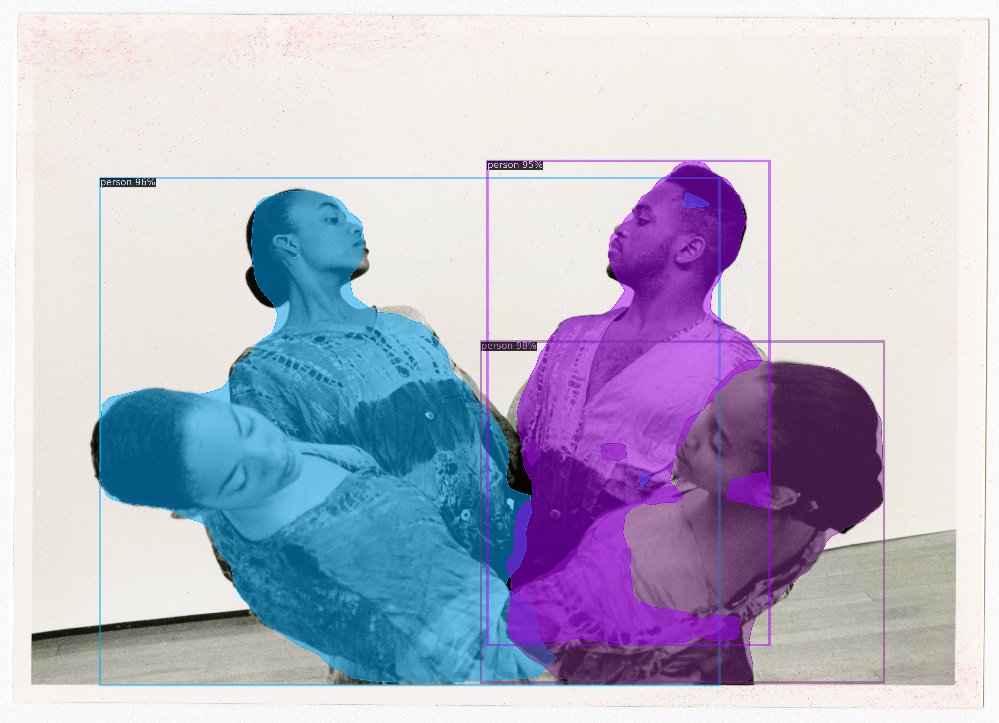

In [15]:
dvt_show_instance_predictions(instances, md, im)